Burak Ekim - burak.ekim@unibw.de 

In [1]:
import os
import sys
import numpy as np
import segmentation_models_pytorch as smp
import segmentation_models_p as sp

import tifffile
import albumentations as A
from matplotlib import pyplot as plt
import skimage.io
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import random
sys.path.append("..") 

from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import jaccard_score

import tqdm

### Utils 

In [2]:
palette ={ 0 : (0,0,0),  #no data
           1 : (128, 255, 0), #forest
           2 : (166, 0, 204), #mine
           3 : (204, 0, 0), #road
           4 : (255, 0, 0), #disc urban   
           5 : (255, 255, 168), #arable land
           6 : (255,230,166), #heteregonous agricultural areas
           7 : (231, 40, 252), #permenant crops
           8 : (0, 204, 242),  #inland waters
           9 : (255, 166, 255),  #artificial non-agricultural vegetated areas
         }

invert_palette = {v: k for k, v in palette.items()}

def convert_to_color(arr_2d, palette=palette):
    """ Numeric labels to RGB-color encoding """
    arr_3d = np.zeros((arr_2d.shape[0], arr_2d.shape[1], 3), dtype=np.uint8)

    for c, i in palette.items():
        m = arr_2d == c
        arr_3d[m] = i

    return arr_3d

def convert_from_color(arr_3d, palette=invert_palette):
    """ RGB-color encoding to grayscale labels """
    arr_2d = np.zeros((arr_3d.shape[0], arr_3d.shape[1]), dtype=np.uint8)

    for c, i in palette.items():
        m = np.all(arr_3d == np.array(c).reshape(1, 1, 3), axis=2)
        arr_2d[m] = i

    return arr_2d

# helper function for data visualization
def visualize_in_one_row(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()
    
def scale_range(input, min, max):
    input += -(np.min(input))
    input /= (1e-9 + np.max(input) / (max - min + 1e-9))
    input += min
    return input

def show_image(im,target_file): #PCG
      if len(im.shape) == 2:
        im = scale_range(im, 0, 255).astype(np.uint8)
        plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')
        plt.imshow(im,cmap='gray')
        plt.show()

      elif len(im.shape) == 3:
        im = np.array([scale_range(i, 0, 255) for i in im.transpose((2,0,1))]).transpose(1,2,0)[...,:3].astype(np.uint8)
        plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')
        plt.savefig(target_file, format = 'png', dpi =80,  transparent = True, bbox_inches = 'tight', pad_inches = 0)
        plt.imshow(im)
        plt.show()

def seed_everything(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    
def evaluate(model, generator):
    """ usage:
        from sklearn.metrics import classification_report
        y_pred, y = evaluate(best_model, generator)
        y_pred  = np.hstack(y_pred)
        y = np.hstack(y)
        targets = ['building', 'not_building']
        print(classification_report(y, y_pred, target_names = targets))#, output_dict = True)
    """
    
    best_model = model
    best_model.cuda()
    best_model.eval()

    y_preds = list()
    ys = list()
    with torch.no_grad():
        for idx in tqdm.tqdm(range(len(generator))):
            X,y = generator[idx]
            #X = X.detach().cpu().numpy()
            y = y.detach().cpu().numpy()
            gt_max = np.argmax(y, axis=0)
            #gt_colora = convert_to_color(gt_max)
            logsoftmax = best_model.forward(X[None,:,:])
            y_pred = logsoftmax.argmax(dim=1)
            y_pred = y_pred.squeeze()
            gt_color = torch.as_tensor(gt_max).cuda()
            gt_color = gt_color.detach().cpu().numpy().flatten()
            y= gt_color 
            y_pred = y_pred.flatten().detach().cpu().numpy()
            
            ys.append(y)
            y_preds.append(y_pred)
            
    best_model.cpu()
    return y_preds, ys    
    
def collate_fn(batch):
    batch = list(filter(lambda x: x is not None, batch))
    out = torch.utils.data.dataloader.default_collate(batch)
    print("len batch",len(out))
    return out

Class_names = ['NoData',
               'Forest',
               'Mine, dump and construction sites',
                'Road and Rail',
                'Discontinious Urban Fabric',
               'Arable Land',
               'Heterogeneous agricultural areas',
                'Permenant Crops',
                'Inland Waters',
                'Artificial, non-agricultural vegetated areas'] 

### Calculate mean and std 

In [ ]:
def _compute_stats_for_image(file_path: str) -> (np.ndarray, np.ndarray):

        image = skimage.io.imread(file_path, plugin='tifffile')

        mean = image.mean((0, 1))
        std = image.std((0, 1))

        assert mean.shape == (4,), f'mean had shape {mean.shape}'
        assert std.shape == (4,), f'std had shape {std.shape}'

        return mean, std


def _compute_stats_for_dir(dir_name) -> ([np.ndarray], [np.ndarray]):
    if not os.path.isdir(dir_name):
        raise ValueError(f'Directory does not exist: {dir}')

    means = []
    stds = []

    for dir_path, _, file_names in os.walk(dir_name):
        for file_name in file_names:
            mean, std = _compute_stats_for_image(os.path.join(dir_path, file_name))
            means.append(mean)
            stds.append(std)

    return means, stds

from PIL import Image
means, stds = _compute_stats_for_dir(r"C:\Users\CBS-7\Desktop\KOC_LCLU\Aksu\Dataset\Train\Image")

mean_= np.asarray(means) 
mean__ = mean_[~np.isnan(mean_).any(axis=1)]
mean_mean = np.mean(mean__, axis = 0)

stds_ = np.asarray(stds) 
stds__ = stds_[~np.isnan(stds_).any(axis=1)]
stds_mean = np.mean(stds__, axis = 0)
print("MEAN", mean_mean)
print("STD",stds_mean)

### Dataset Instance 

In [ ]:
class MM_Dataset(Dataset):  
    def __init__(
            self, 
            dataset_dir,
            mode,
            transform=None, 
            preprocessing=None,
            sample_ids = False):

        self.dataset_dir = dataset_dir
        self.transform = transform
        self.preprocessing = preprocessing
        self.class_values = np.arange(0,10,1)
        self.sample_ids = sample_ids
        
        if mode == 'train':
            
            self.train_dir = os.path.join(self.dataset_dir, 'Train')
            
            optic_dir = os.path.join(self.train_dir, 'Image')
            mask_dir = os.path.join(self.train_dir, 'Mask')
            
            self.optic_ids = os.listdir(optic_dir)
            self.mask_ids = os.listdir(mask_dir)

            self.optic_fps = [os.path.join(optic_dir, image_id) for image_id in self.optic_ids]
            self.mask_fps = [os.path.join(mask_dir, image_id) for image_id in self.mask_ids]
            print("Training set: {} image".format(len(self.optic_ids)))
            
        if mode == 'val':
            
            self.train_dir = os.path.join(self.dataset_dir, 'Validation')
            
            optic_dir = os.path.join(self.train_dir, 'Image')
            mask_dir = os.path.join(self.train_dir, 'Mask')
            
            self.optic_ids = os.listdir(optic_dir)
            self.mask_ids = os.listdir(mask_dir)

            self.optic_fps = [os.path.join(optic_dir, image_id) for image_id in self.optic_ids]
            self.mask_fps = [os.path.join(mask_dir, image_id) for image_id in self.mask_ids]
            print("Validation set: {} image".format(len(self.optic_ids)))
            
        elif mode == 'test':
            
            self.test_dir = os.path.join(self.dataset_dir, 'Test')
            
            optic_dir = os.path.join(self.test_dir, 'Image')
            mask_dir = os.path.join(self.test_dir, 'Mask')
            
            self.optic_ids = os.listdir(optic_dir)
            self.mask_ids = os.listdir(mask_dir)

            self.optic_fps = [os.path.join(optic_dir, image_id) for image_id in self.optic_ids]
            self.mask_fps = [os.path.join(mask_dir, image_id) for image_id in self.mask_ids]
            print("Test set: {} image".format(len(self.optic_ids)))

    @staticmethod
    def _read_img(image_path):
        img = skimage.io.imread(image_path, plugin='tifffile')
        return img

    def __len__(self):
        return len(self.mask_ids)
    
    def __getitem__(self, idx):
                 
        optic_id = self.optic_fps[idx].split('\\')[-1]
        mask_id = self.mask_fps[idx].split('\\')[-1]

        optic_filepath = self.optic_fps[idx]
        mask_filepath = self.mask_fps[idx]
            
        image = self._read_img(optic_filepath)
        mask = self._read_img(mask_filepath)  
        mask = mask.astype('uint8')
         
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
            
        if self.preprocessing:
            preprocessed  = self.preprocessing(image=image, mask=mask)
            image,mask = preprocessed['image'], preprocessed['mask']
            
        mask_raw = convert_from_color(mask)

        masks = [(mask_raw == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1) 
        image = image.transpose(2, 0, 1).astype('float32')
        mask = mask.transpose(2, 0, 1).astype('float32')

        image = torch.as_tensor(image, dtype=torch.float32).cuda()
        mask = torch.as_tensor(mask, dtype=torch.float32).cuda()
        
        if self.sample_ids is not False:
            return image,mask,optic_id
        
        return image, mask

In [6]:
train_transform = A.Compose(
    [
        A.PadIfNeeded(512,512),
        A.RandomRotate90(),
        A.Flip(),
        A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
        A.Normalize(mean=(415, 498, 508, 656),
                   std=(203,202,178,281)),
    ]
)

val_transform =  A.Compose([ A.PadIfNeeded(512, 512),
                      A.Normalize(mean=(436,512,516,688),
                                std=(216,214,189,292)),
                                ])

test_transform =  A.Compose([ A.PadIfNeeded(512, 512),
                      A.Normalize(mean=(432,506,512,668),
                                std=(218,215,189,285)),
                                ])

In [7]:
SEED = 33
seed_everything(SEED)
dataset_dir = r"C:\Users\CBS-7\Desktop\Satellite_LCLU\Aksu\Dataset"

In [8]:
train_dataset = MM_Dataset(dataset_dir = dataset_dir,
                    mode='train',
                    transform = train_transform)

val_dataset = MM_Dataset(dataset_dir = dataset_dir,
                    mode='val',
                    transform = val_transform)

test_dataset = MM_Dataset(dataset_dir = dataset_dir,
                    mode='test',
                    transform = test_transform)

Training set: 419 image
Validation set: 120 image
Test set: 60 image


### Sampling technique  

In [9]:
from sklearn.utils import compute_sample_weight
from pytorch_toolbelt.utils import fs
from torch.utils.data import WeightedRandomSampler

def get_balanced_weights(dataset):
    labels=[]
    for mask in dataset.mask_fps:
        mask = fs.read_image_as_is(mask)
        unique_labels = np.unique(mask)
        labels.append(''.join([str(int(i)) for i in unique_labels]))

    weights = compute_sample_weight('balanced', labels)
    return weights

In [10]:
mul_factor =  5
train_sampler = WeightedRandomSampler(get_balanced_weights(train_dataset), len(train_dataset) * mul_factor)
val_sampler = WeightedRandomSampler(get_balanced_weights(val_dataset), len(val_dataset) * mul_factor)

### Sanity Check 

torch.Size([4, 512, 512]) torch.Size([10, 512, 512])


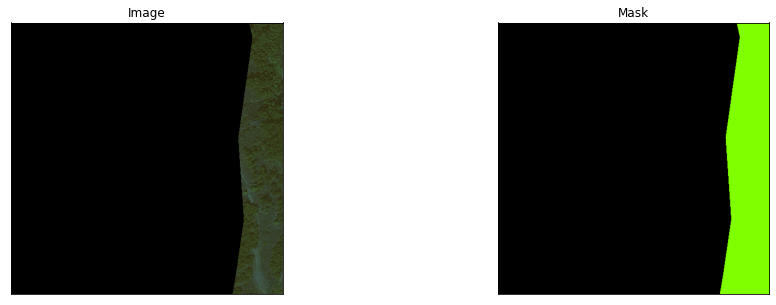

torch.Size([4, 512, 512]) torch.Size([10, 512, 512])


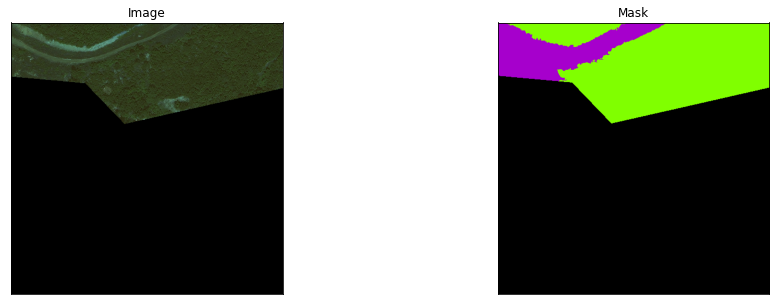

torch.Size([4, 512, 512]) torch.Size([10, 512, 512])


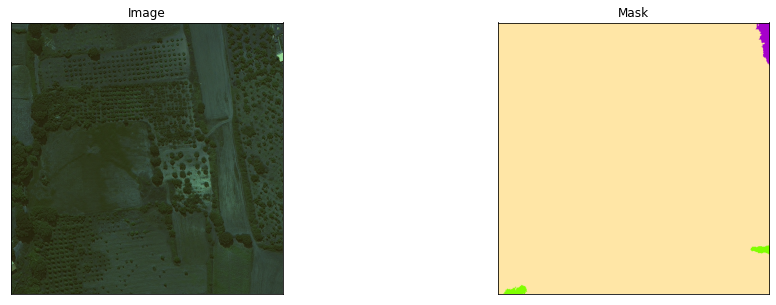

torch.Size([4, 512, 512]) torch.Size([10, 512, 512])


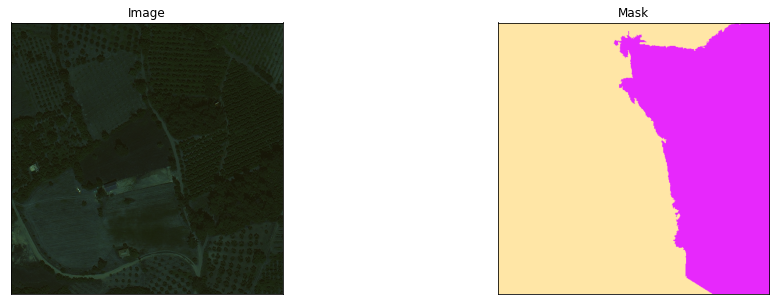

torch.Size([4, 512, 512]) torch.Size([10, 512, 512])


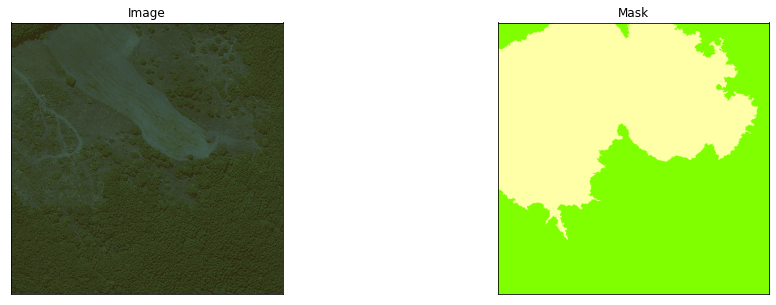

In [11]:
for i in range(5):
    
    idx = np.random.randint(0,len(train_dataset))
    image, mask = train_dataset[idx]
    print(image.shape, mask.shape)
    im = image.detach().cpu().numpy()
    image = np.transpose(im, (1,2,0))
    
    mask = mask.detach().cpu().numpy()
    
    gt_mask = np.transpose(mask, (1,2,0))
    gt_max = np.argmax(gt_mask, axis=-1)
    gt_color = convert_to_color(gt_max)    
    
    visualize_in_one_row(Image = scale_range(image.astype('float'), 0, 255)[...,:3].astype(np.uint8) ,
                         Mask = gt_color)

### Hyperparameters

In [13]:
n_classes = len(palette)
activation = 'softmax'
ENCODER = 'resnext50_32x4d'
ENCODER_WEIGHTS = 'imagenet'
DEVICE = 'cuda'
batch_s = 4
in_ch = 4
lr = 1e-4
n_of_epochs = 150
log_path = r"C:\Users\CBS-7\Desktop\Satellite_LCLU\Aksu\Experiments"
experiment_log = 'aksu_3__dice_focal_imagenet_YESsample_nonormalize_Newpalettte'

### Model definition 

In [15]:
net = smp.DeepLabV3Plus(ENCODER, classes=n_classes, activation=activation, in_channels=in_ch,encoder_weights=ENCODER_WEIGHTS )
net = net.cuda()

### Loss function 

In [16]:
focal = sp.losses.FocalLoss(mode='multilabel',ignore_index = [0])
focal.__name__ = 'Focal'

dice = sp.losses.DiceLoss(mode = 'multilabel',ignore_index = [0])
dice.__name__ = 'Dice'

from pytorch_toolbelt.losses import JointLoss

loss = JointLoss(dice, focal, 1, 0.5)
loss.__name__ ="DF"

In [17]:
train_loader = DataLoader(train_dataset, batch_size=batch_s, sampler = train_sampler)#, shuffle=True)#, collate_fn=collate_fn)
valid_loader = DataLoader(val_dataset, batch_size=batch_s, sampler = val_sampler) #, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=batch_s, shuffle=False)#, collate_fn=collate_fn)

In [18]:
metrics = [smp.utils.metrics.IoU(threshold=0.5, ignore_channels = [0]), 
            smp.utils.metrics.Fscore(threshold=0.5, ignore_channels = [0]),
            smp.utils.metrics.Precision(threshold=0.5, ignore_channels = [0]),
            smp.utils.metrics.Recall(threshold=0.5, ignore_channels = [0])
]

optimizer = torch.optim.Adam([ 
    dict(params=net.parameters(), lr=lr),
])

In [19]:
train_epoch = smp.utils.train.TrainEpoch(
    net, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    net, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

### Train 

In [ ]:
max_score = 0

for i in range(0, n_of_epochs):
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(net, os.path.join(log_path, '.\{}.pth'.format(experiment_log)))
        print('Model saved!')

In [31]:
best_model = torch.load(os.path.join(log_path, '.\{}.pth'.format(experiment_log)))

In [32]:
best_model.cuda()

DeepLabV3Plus(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downs

### Evaluation & Inference 

In [33]:
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_loader)

valid: 100%|█| 15/15 [00:04<00:00,  3.11it/s, DF - 0.4586, iou_score - 0.8946, fscore - 0.9435, precision - 0.9425, rec


In [34]:
logs

{'DF': 0.45856726368268325,
 'iou_score': 0.8946394125620525,
 'fscore': 0.9434987902641296,
 'precision': 0.9425141175587973,
 'recall': 0.9444923480351767}

In [ ]:
for i in range(30):
    
    i = np.random.randint(len(test_dataset))
    image = np.transpose(test_dataset[i][0].detach().cpu().numpy(),(1,2,0))
 #viz_im = np.array([scale_range(i, 0, 255) for i in image.transpose((2,0,1))]).transpose(1,2,0)[...,:3].astype(np.uint8)
    viz_im = np.array([scale_range(i, 0, i.max()) for i in image.transpose((2,0,1))]).transpose(1,2,0)[...,:3].astype(np.uint8)
    gt_mask = np.transpose(test_dataset[i][1].detach().cpu().numpy(),(1,2,0))
    gt_max = np.argmax(gt_mask, axis=-1)
    gt_color = convert_to_color(gt_max)    

    x_tensor = test_dataset[i][0]
    tensor = torch.unsqueeze(torch.tensor(x_tensor), axis = 0)
    tensor = tensor.float() 
    tensor = torch.tensor(tensor, device = 'cuda')

    pr_mask = best_model.predict(tensor).detach().cpu().numpy()
    pr_max  = np.argmax(pr_mask, 1)
    pr_max = np.transpose(pr_max, (1,2,0)).squeeze()
    pr_max11 = convert_to_color(pr_max)

    visualize_in_one_row(
            image=viz_im,  #ımage torch.Size([512, 512, 4])
            ground_truth_mask=gt_color,  #gt_color (512, 512, 3)
            predicted_mask=pr_max11) #pr_max11 (512, 512, 3)

## Class-wise metrics

In [29]:
y_preds, ys = evaluate(best_model, test_dataset)

100%|██████████████████████████████████████████████████████████████████████████████████| 60/60 [00:05<00:00, 10.43it/s]


In [49]:
y_preds = np.asarray(y_preds)
ys = np.asarray(ys)

F1 = f1_score(ys.flatten(), y_preds.flatten(), average=None)
Precision = precision_score(ys.flatten(), y_preds.flatten(), average=None)
Recall = recall_score(ys.flatten(), y_preds.flatten(), average=None)
a = (F1.flatten(), Precision.flatten(), Recall.flatten())

f1 = np.asarray(F1)
prec = np.asarray(Precision)
rec = np.asarray(Recall)

metrics = np.stack((f1, prec, rec), axis = 1)
metrics

array([[0.98868066, 0.99876307, 0.97879977],
       [0.95447521, 0.9567856 , 0.95217595],
       [0.90691172, 0.95172687, 0.8661273 ],
       [0.68357565, 0.77430841, 0.61187651],
       [0.76189513, 0.66403719, 0.89358043],
       [0.92863636, 0.92527548, 0.93202174],
       [0.9335405 , 0.92414127, 0.9431329 ],
       [0.91750227, 0.9269331 , 0.9082614 ],
       [0.9838151 , 0.98440405, 0.98322686],
       [0.95064233, 0.91519435, 0.98894695]])

In [ ]:
jaccard = jaccard_score(ys.flatten(), y_preds.flatten(), average=None)

In [52]:
f1.mean()

0.9009674921470865

In [55]:
jaccard.mean()

0.8318643581456516

In [56]:
prec.mean()

0.9021569394120744

In [57]:
rec.mean()

0.9058149807672905

In [ ]:
f1 = [0.98868066, 0.95447521, 0.90691172, 0.68357565, 0.76189513,
       0.92863636, 0.9335405 , 0.91750227, 0.9838151 , 0.95064233]


params = {'font.size': 52,
              'xtick.labelsize':32,
              'ytick.labelsize':32}
matplotlib.rcParams.update(params)

fig, ax = plt.subplots(figsize=(12, 12))

plt.bar(Class_names, f1)
plt.setp(ax.get_xticklabels(), rotation=90, ha="right",
             rotation_mode="anchor")

###  Confusion Matrix

In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib 
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix 

def plot_confusion_matrix(ys,
                          y_preds,
                          classes,
                          normalize=False,
                          cmap=plt.cm.Greys):

    params = {'font.size': 22,
              'xtick.labelsize':27,
              'ytick.labelsize':27}
    matplotlib.rcParams.update(params)

    cm = confusion_matrix(ys.flatten(), y_preds.flatten())

    if normalize:
         cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
         print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
           
    fig, ax = plt.subplots(figsize=(30, 30))

    im = ax.imshow(cm, interpolation='nearest', cmap=cmap, origin = 'upper') 
    #ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes)
           #ylabel='True label',
           #xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.tight_layout()
    plt.setp(ax.get_xticklabels(), rotation=90, ha="right",
             rotation_mode="anchor")
    # Loop over data dimensions and create text annotations.
    fmt = '.3f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if cm[i,j] == 0.:
                continue
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    #plt.savefig('Confusion-NWPU_enumerated_FINAL.svg', pad_inches = 0, transparent=False, bbox_inches='tight')
    return ax

In [ ]:
plot_confusion_matrix(ys=ys,
                      y_preds=y_preds,
                      classes=Class_names,
                      normalize=True)

## Export Inference Results

Test set: 60 image


<ipython-input-65-c92ba48d3067>:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor = torch.unsqueeze(torch.tensor(x_tensor), axis = 0)
<ipython-input-65-c92ba48d3067>:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor = torch.tensor(tensor, device = 'cuda')


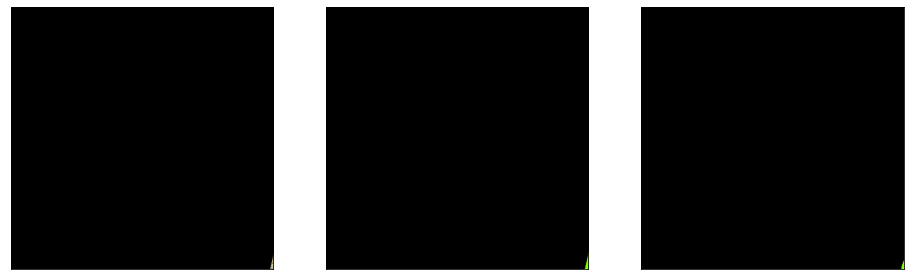

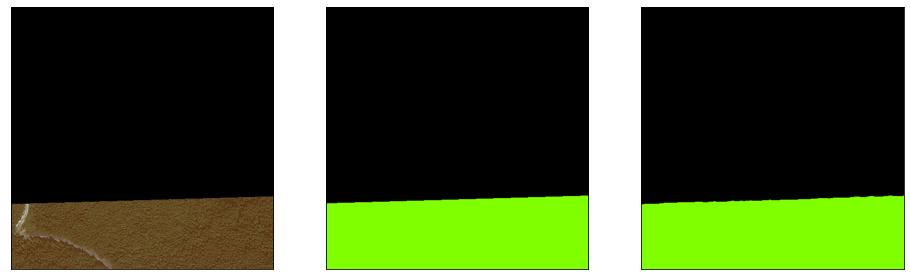

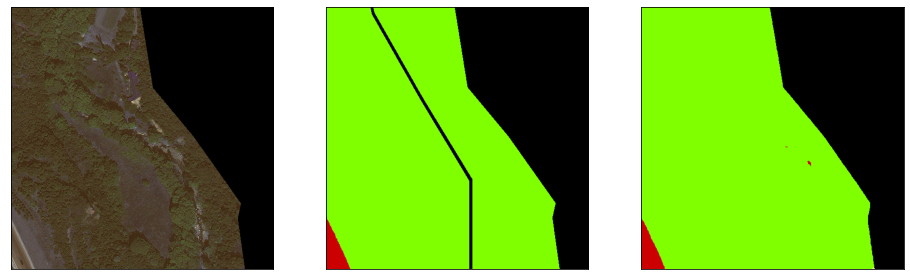

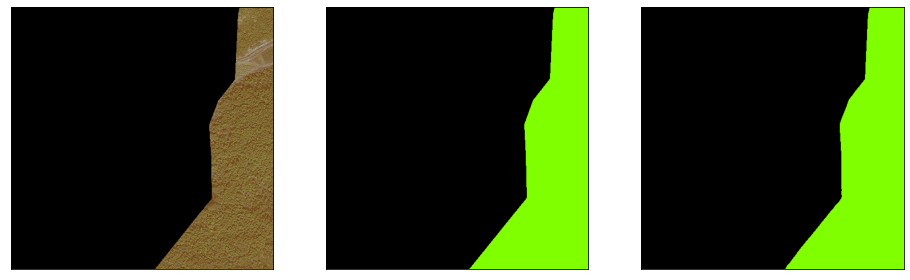

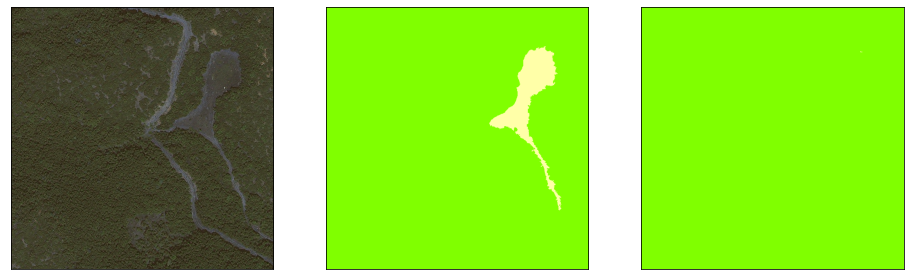

...

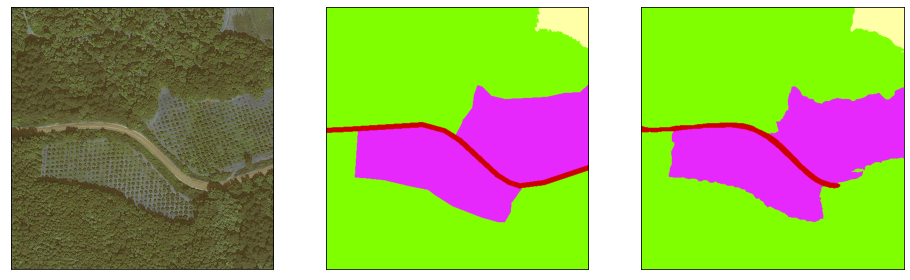

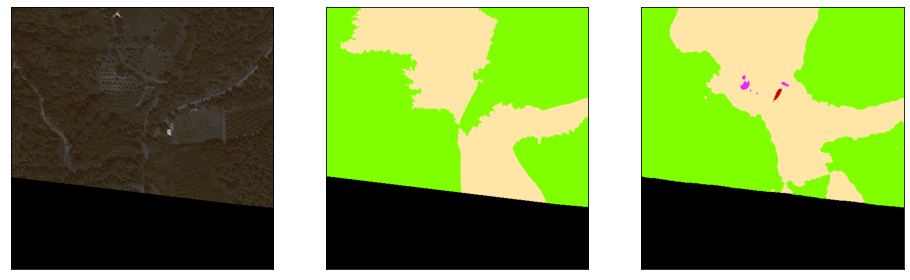

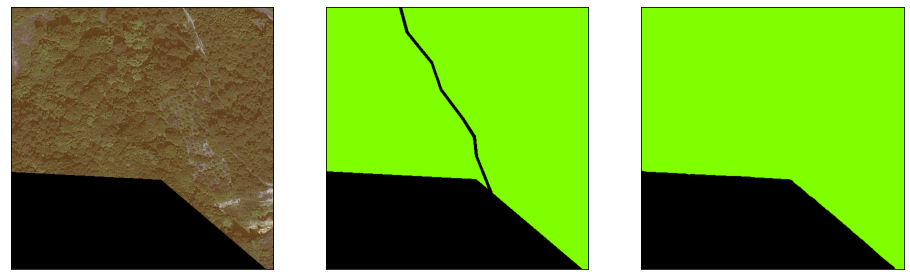

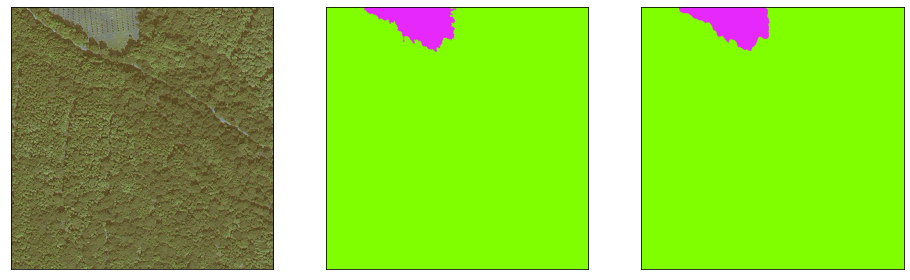

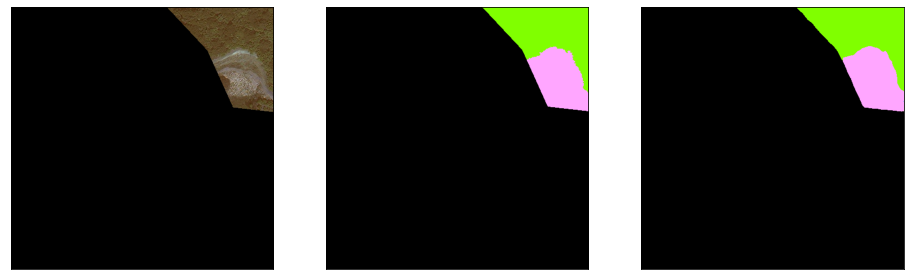

In [65]:
test_dataset = MM_Dataset(sample_ids=True,
                               dataset_dir = dataset_dir,
                                mode='test',
                                transform = test_transform)

def visualize_nd_dwn(idx, **images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        #plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
        save_dir = os.path.join(r'C:\Users\CBS-7\Desktop\New folder', '.\{}.png'.format(idx))
        plt.savefig(save_dir, pad_inches = 0, transparent=False, bbox_inches='tight')
        
    plt.show()

for i in range(len(test_dataset)):


    image = np.transpose(test_dataset[i][0].detach().cpu().numpy(),(1,2,0))
    viz_im = np.array([scale_range(i, 0, 255) for i in image.transpose((2,0,1))]).transpose(1,2,0)[...,:3].astype(np.uint8)
    
    gt_mask = np.transpose(test_dataset[i][1].detach().cpu().numpy(),(1,2,0))
    gt_max = np.argmax(gt_mask, axis=-1)
    gt_color = convert_to_color(gt_max)    

    im_id = test_dataset[i][2]
    
    x_tensor = test_dataset[i][0]
    tensor = torch.unsqueeze(torch.tensor(x_tensor), axis = 0)
    tensor = tensor.float() 
    tensor = torch.tensor(tensor, device = 'cuda')

    pr_mask = best_model.predict(tensor).detach().cpu().numpy()
    pr_max  = np.argmax(pr_mask, 1)
    pr_max = np.transpose(pr_max, (1,2,0)).squeeze()
    pr_max11 = convert_to_color(pr_max)
 
    visualize_nd_dwn(idx = im_id,
                     image=viz_im,  #ımage torch.Size([512, 512, 4])
                    ground_truth_mask=gt_color,  #gt_color (512, 512, 3)
                    predicted_mask=pr_max11) #pr_max11 (512, 512, 3)

## Geo-export

In [ ]:
class MM_Dataset_Inference(Dataset):  
    def __init__(
            self, 
            dataset_dir,
            data_type,
            mode,
            transform=None, 
            preprocessing=None,
            sample_ids=False):

        self.dataset_dir = dataset_dir
        self.data_type = data_type
        self.transform = transform
        self.preprocessing = preprocessing
        self.class_values = np.arange(0,15,1)
        self.sample_ids = sample_ids
        
        optic_dir = os.path.join(self.dataset_dir, 'optic')
        sar_dir = os.path.join(self.dataset_dir, 'sar')
        mask_dir = os.path.join(self.dataset_dir, 'mask')
            
        self.optic_ids = os.listdir(optic_dir)
        self.sar_ids = os.listdir(sar_dir)
        self.mask_ids = os.listdir(mask_dir)

        self.optic_fps = [os.path.join(optic_dir, image_id) for image_id in self.optic_ids]
        self.sar_fps = [os.path.join(sar_dir, image_id) for image_id in self.sar_ids]
        self.mask_fps = [os.path.join(mask_dir, image_id) for image_id in self.mask_ids]
        print("All set: {} image".format(len(self.optic_ids)))

    @staticmethod
    def _read_img(image_path):
        img = skimage.io.imread(image_path, plugin='tifffile')
        return img

    def __len__(self):
        return len(self.mask_ids)
    
    def __getitem__(self, idx):
        
        if self.data_type == 'RGBNIR':
                 
                         
            optic_id = self.optic_fps[idx].split('\\')[-1]
            mask_id = self.mask_fps[idx].split('\\')[-1]

            optic_filepath = self.optic_fps[idx]
            mask_filepath = self.mask_fps[idx]
            
            #try:
            image = self._read_img(optic_filepath)
            mask = self._read_img(mask_filepath)  
            mask = mask.astype('uint8')

        
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
            
        if self.preprocessing:
            preprocessed  = self.preprocessing(image=image, mask=mask)
            image,mask = preprocessed['image'], preprocessed['mask']
            
        image = np.asarray(image) / (image.max() + 1e-5) #normalize
        
        mask_raw = convert_from_color(mask)
        masks = [(mask_raw == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1) 
        
        image = image.transpose(2, 0, 1).astype('float32')
        mask = mask.transpose(2, 0, 1).astype('float32')
        
        image = torch.as_tensor(image, dtype=torch.float32).cuda()
        mask = torch.as_tensor(mask, dtype=torch.float32).cuda()
        
        if self.sample_ids is not False:
            return image,mask,optic_id, optic_filepath
        
        return image, mask

In [ ]:
dataset_dir2 = r"C:\Users\CBS-7\Desktop\r1c1_s6_psp\data4"
data_type = 'RGBNIR'
test_dataset = MM_Dataset_Inference(sample_ids=True,
                               dataset_dir = dataset_dir2,
                                data_type=data_type,
                                mode='test',
                                transform = test_transform)

In [ ]:
from skimage import io
from osgeo import osr, gdal
import tifffile
import torch.nn as nn
import cv2 
from skimage.restoration import denoise_bilateral

for i in range(len(test_dataset)):
        
    image = np.transpose(test_dataset[i][0].detach().cpu().numpy(),(1,2,0))
    viz_im = np.array([scale_range(i, 0, 255) for i in image.transpose((2,0,1))]).transpose(1,2,0)[...,:3].astype(np.uint8)
    
    gt_mask = np.transpose(test_dataset[i][1].detach().cpu().numpy(),(1,2,0))
    gt_max = np.argmax(gt_mask, axis=-1)
    gt_color = convert_to_color(gt_max)    
 
    x_tensor = test_dataset[i][0]
    tensor = torch.unsqueeze(torch.tensor(x_tensor), axis = 0)
    tensor = tensor.float() 
    tensor = torch.tensor(tensor, device = 'cuda')

    pr_mask = best_model.predict(tensor).detach().cpu().numpy()
    pr_max  = np.argmax(pr_mask, 1)
    pr_max = np.transpose(pr_max, (1,2,0)).squeeze()
    pr_max11 = convert_to_color(pr_max)
    
    image_dir = test_dataset[i][-1]
    ds = gdal.Open(image_dir)
    
    im = tifffile.imread(image_dir)
    width = im.shape[1]
    height = im.shape[0]

    tfw = ds.GetGeoTransform()
    prj = ds.GetProjection()
    srs = osr.SpatialReference(wkt=prj)
    driver = gdal.GetDriverByName("GTiff")
    out_path1 = r"C:\Users\CBS-7\Desktop\Notebook\BASELINE_Notebooks\Band-Modality\Inference_Results\4BAND_GEO"
    out_p = os.path.join(out_path1, os.path.split(image_dir)[-1])
    outdata = driver.Create(out_p, height, width, 3, gdal.GDT_Byte)
    outdata.SetGeoTransform(tfw)##sets same geotransform as input
    outdata.SetProjection(ds.GetProjection())##sets same projection as input
    outdata.GetRasterBand(1).WriteArray(pr_max11[:,:,0])
    outdata.GetRasterBand(2).WriteArray(pr_max11[:,:,1])
    outdata.GetRasterBand(3).WriteArray(pr_max11[:,:,2])

    outdata.FlushCache()
    outdata = None
    ds=None

In [ ]:
from skimage import io
from osgeo import osr, gdal
import tifffile
import torch.nn as nn

prediction_directory = r'C:/Users/CBS-7/Desktop/Harita/yol_/dataset/DATASET/test/image/'
prediction_images = os.listdir(prediction_directory)
output_path = r'C:\Users\CBS-7\Desktop\Harita\yol_\Outputs\prediction_results'
output_path = os.path.join(output_path, 'Outputs')

for img in prediction_images:
    image_dir = prediction_directory + img
    image = io.imread(image_dir)
    im = image[:,:,0:3]
    im = np.transpose(im,(1,0,2))
    #x_tensor1 = torch.from_numpy(image).unsqueeze(0).float()
    #x_tensor2 = torch.transpose(x_tensor1,1,3)
    #tenss1 = torch.as_tensor(x_tensor2, device = 'cuda')

    #conv = nn.Conv2d(4, 3, kernel_size=(3, 3), stride=(1,1), padding=(1, 1), bias=False)
    #im_conv1 = conv(x_tensor2)
    #im_conv2 = np.transpose(im_conv1.detach().cpu().numpy().squeeze(), (1,2,0))
    imm_pree = preprocessing_fn(im)    

    x_tensorR = torch.from_numpy(imm_pree).unsqueeze(0).float()
    print(x_tensorR.shape)
    x_tensorR2 = torch.transpose(x_tensorR,1,3)
    tenssx = torch.as_tensor(x_tensorR2, device = 'cuda')
    outseg = best_model.predict(tenssx)
    pr_mask = (outseg.squeeze().cpu().numpy().round())

    plt.figure(figsize=(10, 10))
    plt.imshow(pr_mask)
    plt.show()
    
    out_path = output_path + img
    
    im = tifffile.imread(image_dir)
    width = im.shape[1]
    height = im.shape[0]
    ds = gdal.Open(image_dir)
    tfw = ds.GetGeoTransform()
    prj = ds.GetProjection()
    srs = osr.SpatialReference(wkt=prj)
    driver = gdal.GetDriverByName("GTiff")
    
    outdata = driver.Create(out_path, height, width, 1, gdal.GDT_Byte)
    outdata.SetGeoTransform(tfw)##sets same geotransform as input
    outdata.SetProjection(ds.GetProjection())##sets same projection as input
    outdata.GetRasterBand(1).WriteArray(pr_mask * 255)
    outdata.FlushCache() ##saves to disk!!
    outdata = None
    ds=None

### End ^^ 